# Importing the data

In [1]:
import numpy as np
# Make numpy values easier to read.
np.set_printoptions(precision=3, suppress=True)
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers
import tensorflow_addons as tfa
import matplotlib as mpl
import seaborn as sns
from matplotlib import pyplot as plt
import nfp
from collections import namedtuple
from kgcnn.layers.casting import ChangeTensorType, ChangeIndexing
from kgcnn.layers.conv.schnet_conv import SchNetInteraction
from kgcnn.layers.mlp import MLP
from kgcnn.layers.gather import GatherNodes, GatherState, GatherNodesIngoing
from kgcnn.layers.geom import BesselBasisLayer, EdgeDirectionNormalized, EdgeAngle
from kgcnn.layers.conv.painn_conv import PAiNNconv, PAiNNUpdate
from kgcnn.layers.conv.megnet_conv import MEGnetBlock
from kgcnn.layers.conv.dimenet_conv import DimNetOutputBlock, DimNetInteractionPPBlock
from kgcnn.utils.loss import ScaledMeanAbsoluteError
from input_generation import *
import itertools
from typing import List
import datetime
from rdkit import RDLogger

In [2]:
### Load input data ###
data = pd.read_pickle('data_complete_final')
data.head()

,translation,rotation,rad_name,h_name,central_atom_idx_1,central_atom_idx_2,rad_charge,h_charge,hash_u1,hash_u2,...,lmbtr_rad_start,lmbtr_H_start,SMILES_sys_start,pdb_file_end,morgan_end,soap_rad_end,soap_H_end,lmbtr_rad_end,lmbtr_H_end,SMILES_sys_end
3,0.803510,270.0,Hyl-amid,Thr-amid,23.0,7.0,0.0,0.0,8754994733906,8754977793765,...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",CC(=O)C(N)C(N)=O.NCC(O)CCC(N)C(N)O,/hits/basement/mbm/riedmiki/structures/KR0008/...,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0.00046822964064590624, 0.003321528911214239...","[[0.008900222204147426, 0.04679743876133917, 0...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",CC(=O)C(N)C(N)=O.NCC(O)CCC(N)C(N)O
5,1.994497,60.0,Hyl-amid,Thr-amid,17.0,7.0,0.0,0.0,8754996169244,8754981509455,...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",CC(=O)C(N)C(N)=O.NCC(O)CCC(N)C(N)O,/hits/basement/mbm/riedmiki/structures/KR0008/...,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0.0004517923584980096, 0.003298088086730262,...","[[0.010480681134706005, 0.05444424966845287, 0...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",CC(=O)C(N)C(N)=O.NCC(O)CCC(N)C(N)O
7,2.010190,240.0,Hyl-amid,Thr-amid,12.0,7.0,0.0,0.0,8755001596395,8754978356529,...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",CC(=O)C(N)C(N)=O.NCC(O)CCC(N)C(N)O,/hits/basement/mbm/riedmiki/structures/KR0008/...,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0.0005116912834079438, 0.003398872204448246,...","[[0.01060160088240023, 0.05319576884389037, 0....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",CC(=O)C(N)C(N)=O.NCC(O)CCC(N)C(N)O
8,1.342340,120.0,Hyl-amid,Thr-amid,15.0,7.0,0.0,0.0,8754996669706,8754981789453,...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",CC(=O)C(N)C(N)=O.NCC(O)CCC(N)C(N)O,/hits/basement/mbm/riedmiki/structures/KR0008/...,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0.00046652448267147707, 0.003328962806179, 0...","[[0.007284088205742367, 0.03837221176115919, 0...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",CC(=O)C(N)C(N)=O.NCC(O)CCC(N)C(N)O
14,2.014465,150.0,Hyl-amid,Val-amid,17.0,9.0,0.0,0.0,8754996178758,8754978855988,...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",CC(C)C(N)C(N)=O.NCC(O)CCC(N)C(N)O,/hits/basement/mbm/riedmiki/structures/KR0008/...,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0.0003923056769002688, 0.0031013514247140513...","[[0.010260228230235542, 0.052228494427901534, ...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",CC(C)C(N)C(N)=O.NCC(O)CCC(N)C(N)O


In [3]:
dict(data.isna().sum())

{'translation': 0,
 'rotation': 2542,
 'rad_name': 0,
 'h_name': 0,
 'central_atom_idx_1': 2942,
 'central_atom_idx_2': 2942,
 'rad_charge': 0,
 'h_charge': 0,
 'hash_u1': 0,
 'hash_u2': 0,
 'tilt_angle': 2542,
 'tilt_axis': 2542,
 'e_max_key': 0,
 'e_max': 0,
 'e_00': 0,
 'e_03': 0,
 'e_04': 0,
 'e_05': 0,
 'e_06': 0,
 'e_07': 0,
 'e_10': 0,
 'meta_path': 0,
 'central_atom_idx': 5750,
 'e_01': 5290,
 'e_02': 5290,
 'e_08': 5290,
 'e_09': 5290,
 'e_s_opt': 5712,
 'e_ts_opt': 5724,
 'e_e_opt': 5712,
 'trajectory': 3706,
 'frame': 3706,
 'indices': 3706,
 'intramol': 3608,
 'charge': 3706,
 'traj_H': 4560,
 'nms': 6052,
 'Ea_opt': 5724,
 'dG_ts_2_opt': 5937,
 'Ea': 0,
 'dG_ts_2': 3075,
 'dG': 0,
 'dG_opt': 5716,
 'rad_name_s': 0,
 'h_name_s': 0,
 'reaction': 0,
 'Err': 5716,
 'dG_ts_1_opt': 5937,
 'dG_ts_1': 3075,
 'Err_s': 5712,
 'Err_ts': 5724,
 'Err_e': 5712,
 'trans_mean': 0,
 'Ea_trans_mean': 0,
 'rad_ref': 0,
 'rad_ref_idx': 0,
 'h_ref': 0,
 'h_ref_idx': 0,
 'rad_chem_name': 0,
 'H

In [4]:
data.dropna(axis = 1, inplace = True)
data.shape

(6150, 80)

In [5]:
data.columns

Index(['translation', 'rad_name', 'h_name', 'rad_charge', 'h_charge',
       'hash_u1', 'hash_u2', 'e_max_key', 'e_max', 'e_00', 'e_03', 'e_04',
       'e_05', 'e_06', 'e_07', 'e_10', 'meta_path', 'Ea', 'dG', 'rad_name_s',
       'h_name_s', 'reaction', 'trans_mean', 'Ea_trans_mean', 'rad_ref',
       'rad_ref_idx', 'h_ref', 'h_ref_idx', 'rad_chem_name', 'H_chem_name',
       'rad_ref_comp', 'H_ref_comp', 'rad_BDE', 'H_BDE', 'rad_BDE_G',
       'H_BDE_G', 'pdb_rad', 'SMILES_rad', 'max_spin_rad', 'mull_charge_rad',
       'bur_vol_default_rad', 'bur_vol_2A_rad', 'bur_vol_iso_rad', 'nBase_rad',
       'SpMax_A_rad', 'ATSC2s_rad', 'ATSC1Z_rad', 'ATSC2i_rad', 'NdNH_rad',
       'SMR_VSA4_rad', 'pdb_H', 'SMILES_H', 'max_spin_H', 'mull_charge_H',
       'bur_vol_default_H', 'bur_vol_2A_H', 'bur_vol_iso_H', 'nBase_H',
       'SpMax_A_H', 'ATSC2s_H', 'ATSC1Z_H', 'ATSC2i_H', 'GATS2dv_H',
       'BCUTdv-1h_H', 'SMR_VSA4_H', 'VSA_EState7_H', 'pdb_file_start',
       'morgan_start', 'soap_rad_star

In [6]:
data_dropped = data.drop(columns = [
    'rad_name', 'h_name', 'hash_u1', 'hash_u2', 'e_max_key', 'e_max', 'e_00', 'e_03', 'e_04',
    'e_05', 'e_06', 'e_07', 'e_10', 'meta_path', 'dG', 'rad_name_s',
    'h_name_s', 'reaction', 'trans_mean', 'Ea_trans_mean', 'rad_ref',
    'rad_ref_idx', 'h_ref', 'h_ref_idx', 'bur_vol_default_rad', 'bur_vol_2A_rad',
    'bur_vol_default_H', 'bur_vol_2A_H'
], axis = 1)

In [7]:
data_dropped.columns

Index(['translation', 'rad_charge', 'h_charge', 'Ea', 'rad_chem_name',
       'H_chem_name', 'rad_ref_comp', 'H_ref_comp', 'rad_BDE', 'H_BDE',
       'rad_BDE_G', 'H_BDE_G', 'pdb_rad', 'SMILES_rad', 'max_spin_rad',
       'mull_charge_rad', 'bur_vol_iso_rad', 'nBase_rad', 'SpMax_A_rad',
       'ATSC2s_rad', 'ATSC1Z_rad', 'ATSC2i_rad', 'NdNH_rad', 'SMR_VSA4_rad',
       'pdb_H', 'SMILES_H', 'max_spin_H', 'mull_charge_H', 'bur_vol_iso_H',
       'nBase_H', 'SpMax_A_H', 'ATSC2s_H', 'ATSC1Z_H', 'ATSC2i_H', 'GATS2dv_H',
       'BCUTdv-1h_H', 'SMR_VSA4_H', 'VSA_EState7_H', 'pdb_file_start',
       'morgan_start', 'soap_rad_start', 'soap_H_start', 'lmbtr_rad_start',
       'lmbtr_H_start', 'SMILES_sys_start', 'pdb_file_end', 'morgan_end',
       'soap_rad_end', 'soap_H_end', 'lmbtr_rad_end', 'lmbtr_H_end',
       'SMILES_sys_end'],
      dtype='object')

# Some statistics

In [8]:
data_stat = data_dropped[[
    'Ea', 'translation', 'rad_BDE', 'H_BDE', 'max_spin_rad',
    'mull_charge_rad', 'bur_vol_iso_rad', 'nBase_rad', 'SpMax_A_rad',
    'ATSC2s_rad', 'ATSC1Z_rad', 'ATSC2i_rad', 'NdNH_rad', 'SMR_VSA4_rad',
    'max_spin_H', 'mull_charge_H', 'bur_vol_iso_H',
    'nBase_H', 'SpMax_A_H', 'ATSC2s_H', 'ATSC1Z_H', 'ATSC2i_H',
    'GATS2dv_H', 'BCUTdv-1h_H', 'SMR_VSA4_H', 'VSA_EState7_H'
]]

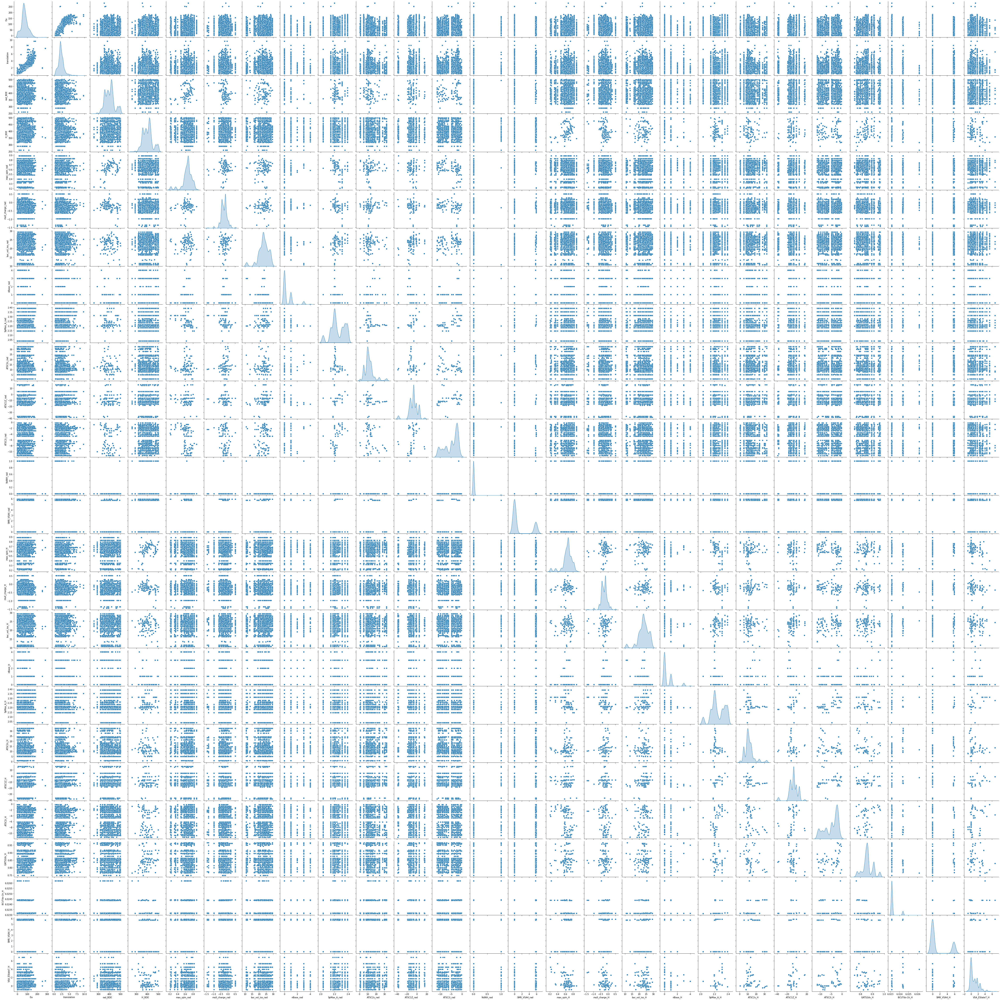

In [9]:
# inspect the data: review the joint distribution of a few pairs of columns from the training set
sns.pairplot(data_stat, diag_kind='kde')

In [10]:
# overall statistics
data_stat.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Ea,6150.0,73.259711,33.368699,0.000000,54.531986,70.196018,91.383941,281.355852
translation,6150.0,2.263703,0.951990,0.300042,1.769832,2.144925,2.704153,9.649046
rad_BDE,6150.0,401.797615,42.672976,260.410829,367.984864,399.832892,427.946040,501.623956
H_BDE,6150.0,401.797615,42.672976,260.410829,367.984864,399.832892,427.946040,501.623956
max_spin_rad,6150.0,0.648288,0.126254,0.203677,0.603861,0.672323,0.729441,0.889032
mull_charge_rad,6150.0,-0.270065,0.213507,-1.437394,-0.407976,-0.261223,-0.162649,0.513736
bur_vol_iso_rad,6150.0,23.126606,3.595009,10.805677,20.920536,23.103304,25.315137,29.399348
nBase_rad,6150.0,0.465854,0.840541,0.000000,0.000000,0.000000,1.000000,4.000000
SpMax_A_rad,6150.0,2.249848,0.098431,2.035648,2.197775,2.214320,2.352993,2.390197
ATSC2s_rad,6150.0,11.633034,5.604816,0.679982,9.266204,10.461050,13.531853,32.628118


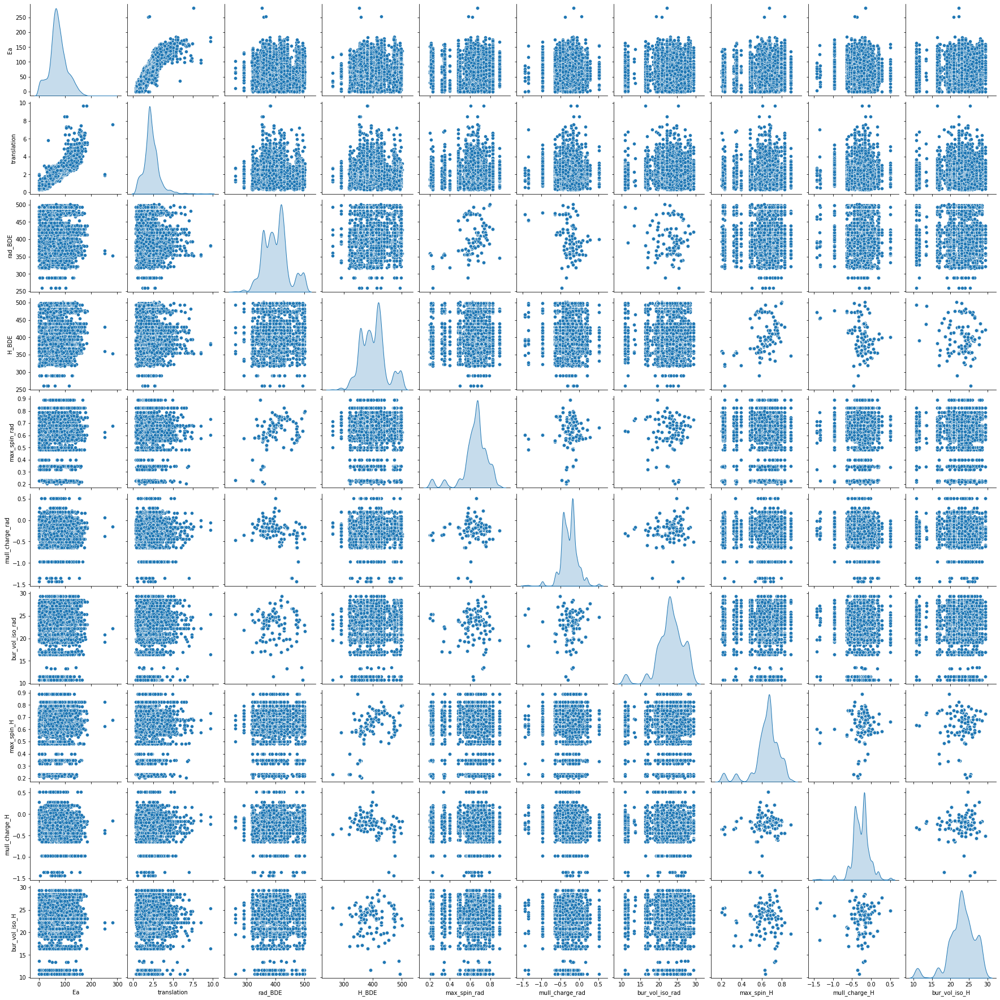

In [11]:
# inspect the data: review the joint distribution of a few pairs of columns from the training set
sns.pairplot(data_stat[[
    'Ea', 'translation', 'rad_BDE', 'H_BDE', 'max_spin_rad',
    'mull_charge_rad', 'bur_vol_iso_rad',
    'max_spin_H', 'mull_charge_H', 'bur_vol_iso_H'
]], diag_kind='kde')

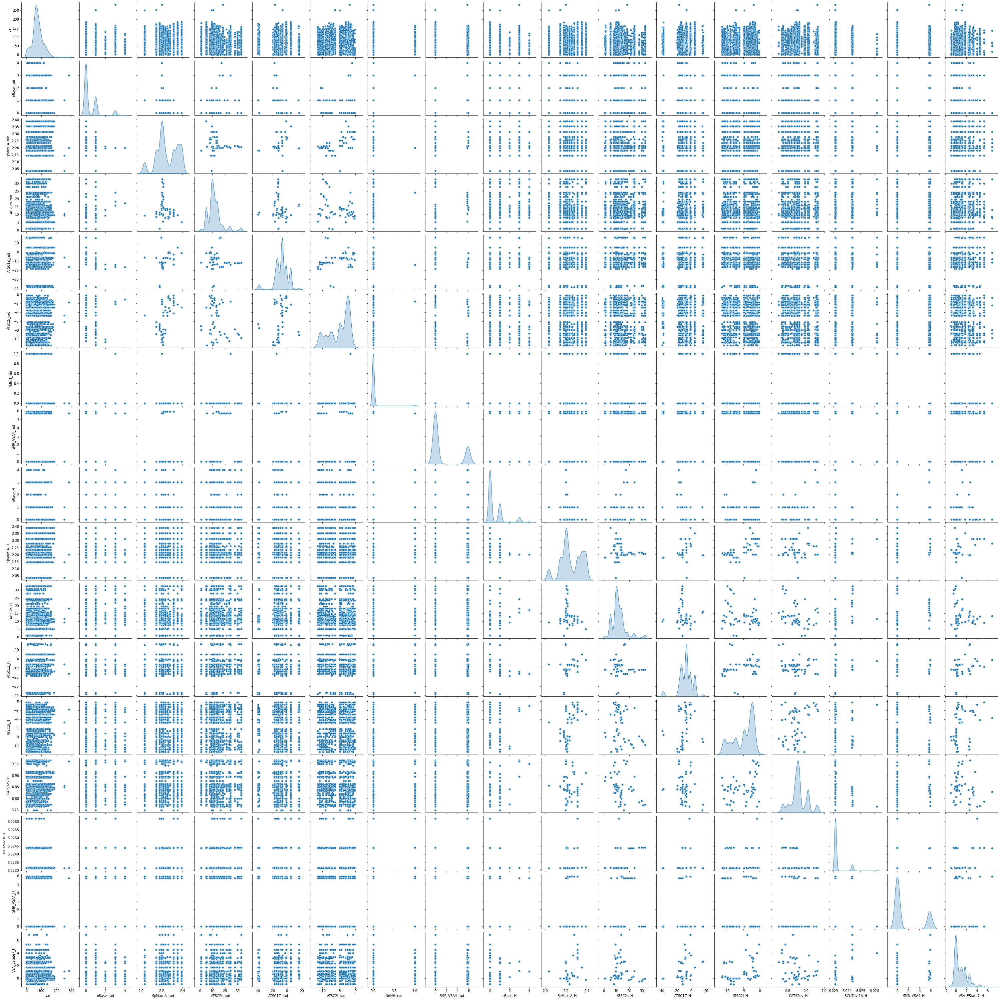

In [12]:
# inspect the data: review the joint distribution of a few pairs of columns from the training set
sns.pairplot(data_stat[[
    'Ea', 'nBase_rad', 'SpMax_A_rad',
    'ATSC2s_rad', 'ATSC1Z_rad', 'ATSC2i_rad', 'NdNH_rad', 'SMR_VSA4_rad',
    'nBase_H', 'SpMax_A_H', 'ATSC2s_H', 'ATSC1Z_H', 'ATSC2i_H',
    'GATS2dv_H', 'BCUTdv-1h_H', 'SMR_VSA4_H', 'VSA_EState7_H'
]], diag_kind='kde')

# Machine Learning Models

In [8]:
data_morgan = data_dropped[[
    'Ea', 'translation', 'rad_charge', 'h_charge', 'rad_BDE', 'H_BDE',
    'max_spin_rad', 'mull_charge_rad', 'bur_vol_iso_rad',
    'max_spin_H', 'mull_charge_H', 'bur_vol_iso_H',
    'nBase_rad', 'SpMax_A_rad', 'ATSC2s_rad', 'ATSC1Z_rad', 'ATSC2i_rad',
    'NdNH_rad', 'SMR_VSA4_rad', 'nBase_H', 'SpMax_A_H', 'ATSC2s_H',
    'ATSC1Z_H', 'ATSC2i_H', 'GATS2dv_H', 'BCUTdv-1h_H', 'SMR_VSA4_H',
    'VSA_EState7_H', 'morgan_start', 'morgan_end'
]]
data_soap = data_dropped[[
    'Ea', 'translation', 'rad_charge', 'h_charge', 'rad_BDE', 'H_BDE',
    'max_spin_rad', 'mull_charge_rad', 'bur_vol_iso_rad',
    'max_spin_H', 'mull_charge_H', 'bur_vol_iso_H',
    'nBase_rad', 'SpMax_A_rad', 'ATSC2s_rad', 'ATSC1Z_rad', 'ATSC2i_rad',
    'NdNH_rad', 'SMR_VSA4_rad', 'nBase_H', 'SpMax_A_H', 'ATSC2s_H',
    'ATSC1Z_H', 'ATSC2i_H', 'GATS2dv_H', 'BCUTdv-1h_H', 'SMR_VSA4_H',
    'VSA_EState7_H', 'soap_rad_start', 'soap_H_start', 'soap_rad_end', 'soap_H_end'
]]
data_lmbtr = data_dropped[[
    'Ea', 'translation', 'rad_charge', 'h_charge', 'rad_BDE', 'H_BDE',
    'max_spin_rad', 'mull_charge_rad', 'bur_vol_iso_rad',
    'max_spin_H', 'mull_charge_H', 'bur_vol_iso_H',
    'nBase_rad', 'SpMax_A_rad', 'ATSC2s_rad', 'ATSC1Z_rad', 'ATSC2i_rad',
    'NdNH_rad', 'SMR_VSA4_rad', 'nBase_H', 'SpMax_A_H', 'ATSC2s_H',
    'ATSC1Z_H', 'ATSC2i_H', 'GATS2dv_H', 'BCUTdv-1h_H', 'SMR_VSA4_H',
    'VSA_EState7_H', 'lmbtr_rad_start', 'lmbtr_H_start', 'lmbtr_rad_end', 'lmbtr_H_end'
]]

In [9]:
def unpack_column(dataframe_in, column):
    dataframe = dataframe_in.reset_index(drop=True)

    if len(dataframe[column][0].shape) > 1:
        max_length = max([len(row[0]) for row in dataframe[column]])
    else:
        max_length = max([len(row) for row in dataframe[column]])

    unpacked = np.empty((len(dataframe[column]), max_length))

    for i, row in zip(range(len(dataframe[column])), dataframe[column]):
        if len(row.shape) > 1:
            row = row[0]

        length_diff = max_length-len(row)
        if length_diff > 0:
            diff = np.zeros(max_length-len(row))
            expanded = np.concatenate((row, diff), axis=1)
            unpacked[i] = expanded
        else:
            unpacked[i] = row

    return pd.DataFrame(unpacked)

def drop_zeros(dataframe):
    df = dataframe.loc[:, (dataframe != 0).any(axis = 0)]
    return df
    
def unpack_join(dataframe, columns):
    unpacked_dfs = []
    for column in columns:
        unpacked_dfs.append(unpack_column(dataframe, column))

    dataframe_compl = dataframe.reset_index(drop=True)
    dataframe_compl.drop(columns = columns, inplace=True)
    for i, df in zip(range(len(unpacked_dfs)), unpacked_dfs):
        dataframe_compl = dataframe_compl.join(df, lsuffix = '_{}'.format(i-1) , rsuffix = '_{}'.format(i))
    
    return dataframe_compl   

In [10]:
# unpack columns in dataframes
data_morgan_unpacked = unpack_join(data_morgan, ['morgan_start', 'morgan_end'])
data_soap_unpacked = unpack_join(data_soap, ['soap_rad_start', 'soap_H_start', 'soap_rad_end', 'soap_H_end'])
data_lmbtr_unpacked = unpack_join(data_lmbtr, ['lmbtr_rad_start', 'lmbtr_H_start', 'lmbtr_rad_end', 'lmbtr_H_end'])

In [11]:
### split the data into training and test sets ###
data_morgan_unpacked_val = data_morgan_unpacked.sample(frac=0.2, random_state=1)
data_morgan_unpacked_test = data_morgan_unpacked[~data_morgan_unpacked.index.isin(data_morgan_unpacked_val.index)].sample(frac=0.2, random_state=1)
data_morgan_unpacked_train = data_morgan_unpacked[~data_morgan_unpacked.index.isin(data_morgan_unpacked_test.index) & ~data_morgan_unpacked.index.isin(data_morgan_unpacked_val.index)]

### OR ###
#data_morgan_unpacked_train, data_morgan_unpacked_val = train_test_split(data_morgan_unpacked, test_size=0.2)

# Save these splits for later
#np.savez_compressed('split_spin_bv.npz', train=data_morgan_unpacked_train, valid=data_morgan_unpacked_val, test=data_morgan_unpacked_test)

In [12]:
data_soap_unpacked = drop_zeros(data_soap_unpacked)

### split the data into training and test sets ###
data_soap_unpacked_val = data_soap_unpacked.sample(frac=0.2, random_state=1)
data_soap_unpacked_test = data_soap_unpacked[~data_soap_unpacked.index.isin(data_soap_unpacked_val.index)].sample(frac=0.2, random_state=1)
data_soap_unpacked_train = data_soap_unpacked[~data_soap_unpacked.index.isin(data_soap_unpacked_test.index) & ~data_soap_unpacked.index.isin(data_soap_unpacked_val.index)]

In [13]:
data_lmbtr_unpacked = drop_zeros(data_soap_unpacked)

### split the data into training and test sets ###
data_lmbtr_unpacked_val = data_lmbtr_unpacked.sample(frac=0.2, random_state=1)
data_lmbtr_unpacked_test = data_lmbtr_unpacked[~data_lmbtr_unpacked.index.isin(data_lmbtr_unpacked_val.index)].sample(frac=0.2, random_state=1)
data_lmbtr_unpacked_train = data_lmbtr_unpacked[~data_lmbtr_unpacked.index.isin(data_lmbtr_unpacked_test.index) & ~data_lmbtr_unpacked.index.isin(data_lmbtr_unpacked_val.index)]

In [14]:
val_Ea = data_morgan_unpacked_val.pop('Ea')
test_Ea = data_morgan_unpacked_test.pop('Ea')
train_Ea = data_morgan_unpacked_train.pop('Ea')

data_morgan_unpacked_val = np.array(data_morgan_unpacked_val)
data_morgan_unpacked_test = np.array(data_morgan_unpacked_test)
data_morgan_unpacked_train = np.array(data_morgan_unpacked_train)

In [15]:
data_soap_unpacked_val.pop('Ea')
data_soap_unpacked_test.pop('Ea')
data_soap_unpacked_train.pop('Ea')

data_soap_unpacked_val = np.array(data_soap_unpacked_val)
data_soap_unpacked_test = np.array(data_soap_unpacked_test)
data_soap_unpacked_train = np.array(data_soap_unpacked_train)

In [16]:
data_lmbtr_unpacked_val.pop('Ea')
data_lmbtr_unpacked_test.pop('Ea')
data_lmbtr_unpacked_train.pop('Ea')

data_lmbtr_unpacked_val = np.array(data_lmbtr_unpacked_val)
data_lmbtr_unpacked_test = np.array(data_lmbtr_unpacked_test)
data_lmbtr_unpacked_train = np.array(data_lmbtr_unpacked_train)

In [16]:
del data_morgan_unpacked, data_soap_unpacked, data_lmbtr_unpacked, data_morgan, data_soap, data_lmbtr, data

# Simple Multilayer Perceptron
Source: https://github.com/pstjohn/gnn-codecamp/blob/main/cetane_number_prediction.ipynb

## Using Morgan Fingerprints

In [37]:
data_morgan_unpacked_train.shape

(3936, 2075)

In [33]:
input = layers.Input(shape=(2075), dtype='float32')
out = layers.Dense(128, activation='relu')(input)
out = layers.BatchNormalization()(out)
out = layers.Dense(64, activation='relu')(out)
out = layers.BatchNormalization()(out)
out = layers.Dense(1)(out)

mlp_model = tf.keras.Model(input, out)

opt = tf.keras.optimizers.Adam(learning_rate=1E-2)
mlp_model.compile(optimizer=opt, loss='mae')

In [34]:
hist = mlp_model.fit(
    x = data_morgan_unpacked_train, y = train_Ea,
    validation_data = (data_morgan_unpacked_val, val_Ea),
    epochs = 30, batch_size = 32,
    verbose = 0
)

In [35]:
mlp_model.evaluate(data_morgan_unpacked_test, test_Ea)

31/31 [==============================] - 0s 1ms/step - loss: 14.3030


14.302967071533203

## Using SOAP

In [45]:
data_soap_unpacked_test.shape

(984, 22987)

In [46]:
input = layers.Input(shape=(22987), dtype='float32')
out = layers.Dense(128, activation='relu')(input)
out = layers.BatchNormalization()(out)
out = layers.Dense(64, activation='relu')(out)
out = layers.BatchNormalization()(out)
out = layers.Dense(1)(out)

mlp_model = tf.keras.Model(input, out)

opt = tf.keras.optimizers.Adam(learning_rate=1E-2)
mlp_model.compile(optimizer=opt, loss='mae')

In [47]:
hist = mlp_model.fit(
    x = data_soap_unpacked_train, y = train_Ea,
    validation_data = (data_soap_unpacked_val, val_Ea),
    epochs = 30, batch_size = 32,
    verbose = 0
)
mlp_model.evaluate(data_soap_unpacked_test, test_Ea)

2022-01-24 18:23:13.310218: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 361907328 exceeds 10% of free system memory.
2022-01-24 18:23:16.696932: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 113096040 exceeds 10% of free system memory.


31/31 [==============================] - 0s 4ms/step - loss: 8.4465


8.446486473083496

## Using LMBTR

In [48]:
data_lmbtr_unpacked_train.shape

(3936, 22987)

In [50]:
input = layers.Input(shape=(22987), dtype='float32')
out = layers.Dense(128, activation='relu')(input)
out = layers.BatchNormalization()(out)
out = layers.Dense(64, activation='relu')(out)
out = layers.BatchNormalization()(out)
out = layers.Dense(1)(out)

mlp_model = tf.keras.Model(input, out)

opt = tf.keras.optimizers.Adam(learning_rate=1E-2)
mlp_model.compile(optimizer=opt, loss='mae')

In [51]:
hist = mlp_model.fit(
    x = data_lmbtr_unpacked_train, y = train_Ea,
    validation_data = (data_lmbtr_unpacked_val, val_Ea),
    epochs = 30, batch_size = 32,
    verbose = 0
)
mlp_model.evaluate(data_lmbtr_unpacked_test, test_Ea)

31/31 [==============================] - 0s 4ms/step - loss: 8.7588


8.758769035339355

# Kai's neural networks
https://github.com/hits-mbm-dev/barriernn/tree/master/src/barriernn

In [30]:
### Basic model
def build_model(loss='mse', metrics='mae', input_shape=(1300,)):
    model = tf.keras.Sequential()
    model.add(layers.Dense(1000, activation="relu", input_shape=input_shape))
    model.add(layers.Dense(500, activation="relu"))
    model.add(layers.Dense(100, activation="relu"))
    model.add(layers.Dense(1,))
    model.compile(optimizer=tf.keras.optimizers.Adam(), loss=loss, metrics=metrics)
    return model


### Dropout Model
def build_do_model(loss='mse', metrics='mae', input_shape=(1300,)):
    model = tf.keras.Sequential()
    model.add(layers.Dense(1300, kernel_initializer='normal', activation='relu', input_shape=input_shape))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(650, activation='relu'))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(325, activation='relu'))
    model.add(layers.Dense(162, activation='relu'))
    model.add(layers.Dense(1))
    learning_rate = (10**(float(-2.36794715)))

    model.compile(
        loss=loss,
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate, epsilon=1e-7),
        metrics=metrics
    )
    return model

In [36]:
# nn_root = Path('/hits/fast/mbm/treydewk/nn/')

# log_dir = nn_root / datetime.datetime.now().strftime('%Y%m%d')

<BatchDataset shapes: ((100, 6150), (100,)), types: (tf.float32, tf.float64)> length: 12 
 <BatchDataset shapes: ((100, 6150), (100,)), types: (tf.float32, tf.float64)> length: 8


In [37]:
# tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir / 'morgan_firsttry', histogram_freq=1) ### change model name

# model.fit(trainset, validation_data=valset, epochs=500,
#           callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20), tensorboard_callback], verbose=0)

2022-01-24 19:40:21.128163: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1476000000 exceeds 10% of free system memory.
2022-01-24 19:40:22.413536: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1476000000 exceeds 10% of free system memory.
2022-01-24 19:40:24.864596: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1476000000 exceeds 10% of free system memory.
2022-01-24 19:40:25.887339: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1476000000 exceeds 10% of free system memory.
2022-01-24 19:40:26.966797: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1476000000 exceeds 10% of free system memory.


## Using Morgan Fingerprints

In [63]:
# Basic model
model = build_model(
    loss='MSLE',
    metrics=['mae', tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))], # MAE_scaled(e_max)
    input_shape=(2075,)
)

In [50]:
model.fit(
    x = data_morgan_unpacked_train, y = train_Ea,
    validation_data = (data_morgan_unpacked_val, val_Ea),
    epochs = 500, batch_size = 100,
    callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20),
    verbose = 0
)

In [51]:
print(model.evaluate(data_morgan_unpacked_test, test_Ea)) 

31/31 [==============================] - 0s 3ms/step - loss: 0.1145 - mae: 7.7021 - r_square: 0.8647
[0.11450833827257156, 7.702098846435547, 0.8647016882896423]


In [54]:
# Dropout model
model_do = build_do_model(
    loss='MSLE',
    metrics=['mae', tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))], # MAE_scaled(e_max)
    input_shape=(2075,)
)

In [57]:
model_do.fit(
    x = data_morgan_unpacked_train, y = train_Ea,
    validation_data = (data_morgan_unpacked_val, val_Ea),
    epochs = 500, batch_size = 100,
    callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20),
    verbose = 0
)

In [58]:
print(model_do.evaluate(data_morgan_unpacked_test, test_Ea)) 

31/31 [==============================] - 0s 4ms/step - loss: 17.7285 - mae: 1562.5500 - r_square: -2200.9729
[17.728485107421875, 1562.550048828125, -2200.972900390625]


In [62]:
# normalize y data
e_max = max(train_Ea.to_list() + test_Ea.to_list() + val_Ea.to_list())
train_Ea_scaled = train_Ea / e_max
test_Ea_scaled = test_Ea / e_max
val_Ea_scaled = val_Ea / e_max

In [68]:
model.fit(
    x = data_morgan_unpacked_train, y = train_Ea_scaled,
    validation_data = (data_morgan_unpacked_val, val_Ea_scaled),
    epochs = 500, batch_size = 100,
    callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20),
    verbose = 0
)

In [72]:
print(model.evaluate(data_morgan_unpacked_test, test_Ea_scaled)) 

31/31 [==============================] - 0s 5ms/step - loss: 0.0605 - mae: 4.6345 - r_square: -1535.3010
[0.06054295599460602, 4.634485244750977, -1535.301025390625]


In [77]:
### Prediction on test set
test_predictions = model.predict(data_morgan_unpacked_test) * e_max

MAE = np.abs(test_Ea - test_predictions.flatten()).mean()
print(MAE)

1303.939596616502


In [70]:
model_do.fit(
    x = data_morgan_unpacked_train, y = train_Ea_scaled,
    validation_data = (data_morgan_unpacked_val, val_Ea_scaled),
    epochs = 500, batch_size = 100,
    callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20),
    verbose = 0
)

In [73]:
print(model_do.evaluate(data_morgan_unpacked_test, test_Ea_scaled)) 

31/31 [==============================] - 0s 4ms/step - loss: 0.0605 - mae: 1489.3143 - r_square: -158337760.0000
[0.06054295599460602, 1489.3143310546875, -158337760.0]


## Using SOAP

In [83]:
# Basic model
model = build_model(
    loss='MSLE',
    metrics=['mae', tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))],
    input_shape=(22987,)
)

In [84]:
model.fit(
    x = data_soap_unpacked_train, y = train_Ea,
    validation_data = (data_soap_unpacked_val, val_Ea),
    epochs = 500, batch_size = 100,
    callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20),
    verbose = 0
)

In [85]:
print(model.evaluate(data_soap_unpacked_test, test_Ea)) 

31/31 [==============================] - 0s 13ms/step - loss: 0.1323 - mae: 9.1397 - r_square: 0.8329
[0.13228806853294373, 9.139715194702148, 0.8329423069953918]


In [89]:
# Dropout model
model_do = build_do_model(
    loss='MSLE',
    metrics=['mae', tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))],
    input_shape=(22987,)
)

In [90]:
model_do.fit(
    x = data_soap_unpacked_train, y = train_Ea,
    validation_data = (data_soap_unpacked_val, val_Ea),
    epochs = 500, batch_size = 100,
    callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20),
    verbose = 0
)

In [91]:
print(model_do.evaluate(data_soap_unpacked_test, test_Ea)) 

31/31 [==============================] - 1s 19ms/step - loss: 17.7285 - mae: 276217.9688 - r_square: -74130024.0000
[17.728485107421875, 276217.96875, -74130024.0]


## Using LMBTR

In [86]:
# Basic model
model = build_model(
    loss='MSLE',
    metrics=['mae', tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))], # MAE_scaled(e_max)
    input_shape=(22987,)
)

In [87]:
model.fit(
    x = data_lmbtr_unpacked_train, y = train_Ea,
    validation_data = (data_lmbtr_unpacked_val, val_Ea),
    epochs = 500, batch_size = 100,
    callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20),
    verbose = 0
)

In [88]:
print(model.evaluate(data_lmbtr_unpacked_test, test_Ea)) 

31/31 [==============================] - 0s 13ms/step - loss: 0.1227 - mae: 9.7332 - r_square: 0.8181
[0.12269677221775055, 9.733245849609375, 0.8181293606758118]


# Simple machine learning models tested by Liza
https://github.com/KRiedmiller/MA_MLforKIMMDY/blob/main/feed_forward_models.py

In [17]:
def create_mlp_d1_dropout(input_shape):  
    '''MLP model with 2 tf.keras.layers.Dropout (0.3) layers. 
        hidden_layers = [1300, 650, 325, 162, 1], 
        activation function = 'tanh'.
    '''
    
    model = tf.keras.models.Sequential() 
    model.add(tf.keras.layers.Dense(1300, kernel_initializer = 'normal', activation = 'tanh',
    input_shape = (input_shape,)))
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Dense(650, activation = 'tanh')) 
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Dense(325, activation = 'tanh')) 
    model.add(tf.keras.layers.Dense(162, activation = 'tanh'))
    model.add(tf.keras.layers.Dense(1))
    model.compile(
        loss = 'mse', 
        optimizer = tf.keras.optimizers.Adam(lr=10**(float(-2.36794715)),epsilon=1e-8), 
        metrics = ['mean_absolute_error']
        )
    return model

def create_mlp_d1(input_shape):  
    '''MLP model without tf.keras.layers.Dropout. 
        hidden_layers = [1300, 650, 325, 162, 1], 
        activation function = 'relu'.
    '''

    model = tf.keras.models.Sequential()  
    model.add(tf.keras.layers.Dense(1300, kernel_initializer = 'normal', activation = 'relu',
                    input_shape = (input_shape,))) # maybe adjust input shape
    model.add(tf.keras.layers.Dense(650, activation = 'relu')) 
    model.add(tf.keras.layers.Dense(325, activation = 'relu')) 
    model.add(tf.keras.layers.Dense(162, activation = 'relu'))
    model.add(tf.keras.layers.Dense(1))
    model.compile(
        loss = 'mse', 
        optimizer = tf.keras.optimizers.Adam(lr=10**(float(-2)),epsilon=1e-8), 
        metrics = ['mean_absolute_error']
        )
    return model

def create_mlp_soap(input_shape):
    '''MLP model with SOAP encoded dataset with tf.keras.layers.Dropout.'''
    model = tf.keras.models.Sequential() 
    model.add(tf.keras.layers.Dense(input_shape, kernel_initializer = 'normal', activation = 'tanh',
                input_shape = (input_shape,))),
    model.add(tf.keras.layers.Dense(4704, activation = 'tanh')),
    model.add(tf.keras.layers.Dense(3000, activation = 'tanh')),
    model.add(tf.keras.layers.Dropout(0.1)),
    model.add(tf.keras.layers.Dense(2000, activation = 'tanh')),
    model.add(tf.keras.layers.Dense(960, activation = 'tanh')),
    model.add(tf.keras.layers.Dropout(0.3)),
    model.add(tf.keras.layers.Dense(760, activation = 'tanh')),
    model.add(tf.keras.layers.Dropout(0.3)),
    model.add(tf.keras.layers.Dense(510, activation = 'tanh')),
    model.add(tf.keras.layers.Dense(60, activation = 'tanh')),
    model.add(tf.keras.layers.Dense(1))  

    model.compile(
        loss = 'mse', 
        optimizer = tf.keras.optimizers.Adam(lr=0.0001,epsilon=1e-8), 
        metrics = ['mean_absolute_error']
        )
    return model

def create_mlp_d2(input_shape):
    '''MLP model without tf.keras.layers.Dropout.'''
    act = 'relu'

    input_shape = (input_shape,)
    inputs = tf.keras.Input(shape=input_shape)
    x = inputs
    x = tf.keras.layers.Dense(5000, kernel_initializer = 'normal', activation = act)(x)
    x = tf.keras.layers.Dense(2670, activation = act)(x)
    x = tf.keras.layers.Dense(10, activation = act)(x)
    x = tf.keras.layers.Dense(5000, activation = act)(x)
    x = tf.keras.layers.Dense(5000, activation = act)(x)
    x = tf.keras.layers.Dense(10, activation = act)(x)
    x = tf.keras.layers.Dense(5000, activation = act)(x)
    x = tf.keras.layers.Dense(5000, activation = act)(x)
    x = tf.keras.layers.Dense(10, activation = act)(x)
    x = tf.keras.layers.Dense(5000, activation = act)(x)
    x = tf.keras.layers.Dense(1)(x)
    model = tf.keras.Model(inputs=inputs, outputs=x)
    
    hp_learning_rate = 0.000001

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=hp_learning_rate),
                loss='msle',
                metrics=['mean_absolute_error'])
    return model

def create_mlp_d3(input_shape):
    '''MLP model with tf.keras.layers.Dropout.'''
    dropout = 0.007
    act = 'relu'

    input_shape = (input_shape,)
    inputs = tf.keras.Input(shape=input_shape)
    x = inputs
    x = tf.keras.layers.Dense(3824, kernel_initializer = 'normal', activation = act)(x)
    x = tf.keras.layers.Dense(5000, activation = act)(x)
    x = tf.keras.layers.Dropout(dropout)(x)
    x = tf.keras.layers.Dense(10, activation = act)(x)
    x = tf.keras.layers.Dropout(dropout)(x)
    x = tf.keras.layers.Dense(10, activation = act)(x)
    x = tf.keras.layers.Dropout(dropout)(x)
    x = tf.keras.layers.Dense(5000, activation = act)(x)
    x = tf.keras.layers.Dropout(dropout)(x)
    x = tf.keras.layers.Dense(5000, activation = act)(x)
    x = tf.keras.layers.Dropout(dropout)(x)
    x = tf.keras.layers.Dense(10, activation = act)(x)
    x = tf.keras.layers.Dropout(dropout)(x)
    x = tf.keras.layers.Dense(10, activation = act)(x)
    x = tf.keras.layers.Dropout(dropout)(x)
    x = tf.keras.layers.Dense(10, activation = act)(x)
    x = tf.keras.layers.Dense(1)(x)
    model = tf.keras.Model(inputs=inputs, outputs=x)
    
    hp_learning_rate = 0.000001

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=hp_learning_rate),
                loss ='msle',
                metrics=['mean_absolute_error'])
    return model

def create_mlp_d4(input_shape): 
    '''MLP model without tf.keras.layers.Dropout.'''
    act = 'relu'

    input_shape = (input_shape,)
    inputs = tf.keras.Input(shape=input_shape)
    x = inputs
    x = tf.keras.layers.Dense(5000, kernel_initializer = 'normal', activation = act)(x)
    x = tf.keras.layers.Dense(10, activation = act)(x)
    x = tf.keras.layers.Dense(10, activation = act)(x)
    x = tf.keras.layers.Dense(5000, activation = act)(x)
    x = tf.keras.layers.Dense(1)(x)
    model = tf.keras.Model(inputs=inputs, outputs=x)
    
    hp_learning_rate = 0.000001

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=hp_learning_rate),
                loss = 'msle',
                metrics=['mean_absolute_error'])
    return model

## Using Morgan Fingerprints

In [19]:
input_shape = data_morgan_unpacked_train.shape[1]

In [23]:
mlp_d1_do = create_mlp_d1_dropout(input_shape)

2022-01-24 23:12:10.246849: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-01-24 23:12:10.250663: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /hits/fast/mbm/software/gaussian/g09d1/g09:/hits/fast/mbm/software/gaussian/g09d1/g09:/hits/fast/mbm/software/gaussian/g09d1/g09:
2022-01-24 23:12:10.251842: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /hits/fast/mbm/software/gaussian/g09d1/g09:/hits/fast/mbm/software/gaussian/g09d1/g09:/hits/fast/mbm/software/gaussian/g09d1/g09:
2022-01-24 23:12:10.252880: 

In [24]:
mlp_d1_do.fit(
    x = data_morgan_unpacked_train, y = train_Ea,
    validation_data = (data_morgan_unpacked_val, val_Ea),
    epochs = 500, batch_size = 100,
    callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20),
    verbose = 0
)

In [25]:
print(mlp_d1_do.evaluate(data_morgan_unpacked_test, test_Ea))

31/31 [==============================] - 0s 4ms/step - loss: 1116.4373 - mean_absolute_error: 24.9001
[1116.437255859375, 24.90009117126465]


In [26]:
del mlp_d1_do

In [27]:
mlp_d1 = create_mlp_d1(input_shape)

/hits/fast/mbm/treydewk/.venv/venv_up/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [28]:
mlp_d1.fit(
    x = data_morgan_unpacked_train, y = train_Ea,
    validation_data = (data_morgan_unpacked_val, val_Ea),
    epochs = 500, batch_size = 100,
    callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20),
    verbose = 0
)

In [29]:
print(mlp_d1.evaluate(data_morgan_unpacked_test, test_Ea))

31/31 [==============================] - 0s 4ms/step - loss: 226.8465 - mean_absolute_error: 11.6246
[226.84652709960938, 11.624579429626465]


In [30]:
del mlp_d1

In [31]:
mlp_d2 = create_mlp_d2(input_shape)

In [32]:
mlp_d2.fit(
    x = data_morgan_unpacked_train, y = train_Ea,
    validation_data = (data_morgan_unpacked_val, val_Ea),
    epochs = 500, batch_size = 100,
    callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20),
    verbose = 0
)

In [33]:
print(mlp_d2.evaluate(data_morgan_unpacked_test, test_Ea))

31/31 [==============================] - 1s 36ms/step - loss: 0.3629 - mean_absolute_error: 21.5077
[0.3628784716129303, 21.507699966430664]


In [40]:
del mlp_d2

In [51]:
mlp_d4 = create_mlp_d4(input_shape) 

In [52]:
mlp_d4.fit(
    x = data_morgan_unpacked_train, y = train_Ea,
    validation_data = (data_morgan_unpacked_val, val_Ea),
    epochs = 500, batch_size = 100,
    callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20),
    verbose = 1
)

Epoch 1/500
40/40 [==============================] - 2s 52ms/step - loss: 12.5850 - mean_absolute_error: 72.2241 - val_loss: 12.0928 - val_mean_absolute_error: 72.3043
Epoch 2/500
40/40 [==============================] - 2s 52ms/step - loss: 11.5534 - mean_absolute_error: 71.9100 - val_loss: 11.1209 - val_mean_absolute_error: 71.9770
Epoch 3/500
40/40 [==============================] - 2s 50ms/step - loss: 10.5725 - mean_absolute_error: 71.5438 - val_loss: 10.0942 - val_mean_absolute_error: 71.5533
Epoch 4/500
40/40 [==============================] - 2s 50ms/step - loss: 9.5390 - mean_absolute_error: 71.0704 - val_loss: 9.0488 - val_mean_absolute_error: 71.0162
Epoch 5/500
40/40 [==============================] - 2s 51ms/step - loss: 8.5362 - mean_absolute_error: 70.4956 - val_loss: 8.1250 - val_mean_absolute_error: 70.4260
Epoch 6/500
40/40 [==============================] - 2s 50ms/step - loss: 7.7203 - mean_absolute_error: 69.9199 - val_loss: 7.3963 - val_mean_absolute_error: 69.857

In [53]:
print(mlp_d4.evaluate(data_morgan_unpacked_test, test_Ea))

31/31 [==============================] - 0s 6ms/step - loss: 0.5255 - mean_absolute_error: 25.5513
[0.5255213975906372, 25.55133628845215]


In [54]:
del mlp_d4

In [20]:
mlp_d5 = create_mlp_soap(input_shape)

2022-01-25 02:15:28.492112: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-01-25 02:15:28.492625: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /hits/fast/mbm/software/gaussian/g09d1/g09:/hits/fast/mbm/software/gaussian/g09d1/g09:/hits/fast/mbm/software/gaussian/g09d1/g09:
2022-01-25 02:15:28.492719: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /hits/fast/mbm/software/gaussian/g09d1/g09:/hits/fast/mbm/software/gaussian/g09d1/g09:/hits/fast/mbm/software/gaussian/g09d1/g09:
2022-01-25 02:15:28.492802: 

In [21]:
mlp_d5.fit(
    x = data_morgan_unpacked_train, y = train_Ea,
    validation_data = (data_morgan_unpacked_val, val_Ea),
    epochs = 500, batch_size = 100,
    callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20),
    verbose = 0
)

In [22]:
print(mlp_d5.evaluate(data_morgan_unpacked_test, test_Ea))

31/31 [==============================] - 1s 21ms/step - loss: 1116.1698 - mean_absolute_error: 24.9341
[1116.1697998046875, 24.93413543701172]


In [ ]:
del mlp_d5

## Using SOAP

In [18]:
input_shape = data_soap_unpacked_train.shape[1]

In [20]:
mlp_d1_do = create_mlp_d1_dropout(input_shape)
mlp_d1_do.fit(
    x = data_soap_unpacked_train, y = train_Ea,
    validation_data = (data_soap_unpacked_val, val_Ea),
    epochs = 500, batch_size = 100,
    callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20),
    verbose = 1
)

2022-01-25 18:00:52.815438: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
/hits/fast/mbm/treydewk/.venv/venv_up/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500
40/40 [==============================] - 8s 172ms/step - loss: 3379.3337 - mean_absolute_error: 49.5479 - val_loss: 2164.5400 - val_mean_absolute_error: 38.0629
Epoch 2/500
40/40 [==============================] - 6s 140ms/step - loss: 1674.8962 - mean_absolute_error: 32.1189 - val_loss: 1273.6593 - val_mean_absolute_error: 26.7409
Epoch 3/500
40/40 [==============================] - 6s 139ms/step - loss: 1211.3527 - mean_absolute_error: 26.1567 - val_loss: 1096.1550 - val_mean_absolute_error: 24.7515
Epoch 4/500
40/40 [==============================] - 6s 140ms/step - loss: 1133.0006 - mean_absolute_error: 25.4203 - val_loss: 1076.4105 - val_mean_absolute_error: 24.7669
Epoch 5/500
40/40 [==============================] - 6s 139ms/step - loss: 1124.9807 - mean_absolute_error: 25.4578 - val_loss: 1074.8263 - val_mean_absolute_error: 24.8237
Epoch 6/500
40/40 [==============================] - 6s 140ms/step - loss: 1125.0599 - mean_absolute_error: 25.5260 - val_loss: 1074.59

In [21]:
print(mlp_d1_do.evaluate(data_soap_unpacked_test, test_Ea))

31/31 [==============================] - 1s 29ms/step - loss: 1116.1118 - mean_absolute_error: 24.9473
[1116.11181640625, 24.947296142578125]


In [22]:
del mlp_d1_do

In [23]:
mlp_d1 = create_mlp_d1(input_shape)
mlp_d1.fit(
    x = data_soap_unpacked_train, y = train_Ea,
    validation_data = (data_soap_unpacked_val, val_Ea),
    epochs = 500, batch_size = 100,
    callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20),
    verbose = 1
)

/hits/fast/mbm/treydewk/.venv/venv_up/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500
40/40 [==============================] - 6s 143ms/step - loss: 45294368.0000 - mean_absolute_error: 1092.5013 - val_loss: 1086.6815 - val_mean_absolute_error: 26.0378
Epoch 2/500
40/40 [==============================] - 5s 137ms/step - loss: 587.5217 - mean_absolute_error: 18.5937 - val_loss: 421.3549 - val_mean_absolute_error: 14.1596
Epoch 3/500
40/40 [==============================] - 5s 138ms/step - loss: 352.1141 - mean_absolute_error: 13.9272 - val_loss: 302.7001 - val_mean_absolute_error: 11.8090
Epoch 4/500
40/40 [==============================] - 5s 137ms/step - loss: 292.0983 - mean_absolute_error: 12.4649 - val_loss: 334.9619 - val_mean_absolute_error: 13.4818
Epoch 5/500
40/40 [==============================] - 5s 137ms/step - loss: 258.6406 - mean_absolute_error: 11.6767 - val_loss: 248.0838 - val_mean_absolute_error: 10.6143
Epoch 6/500
40/40 [==============================] - 5s 137ms/step - loss: 231.9998 - mean_absolute_error: 10.9871 - val_loss: 244.0770 -

In [24]:
print(mlp_d1.evaluate(data_soap_unpacked_test, test_Ea))

31/31 [==============================] - 1s 18ms/step - loss: 177.6458 - mean_absolute_error: 8.2686
[177.64581298828125, 8.268558502197266]


In [25]:
del mlp_d1

In [26]:
mlp_d2 = create_mlp_d2(input_shape)
mlp_d2.fit(
    x = data_soap_unpacked_train, y = train_Ea,
    validation_data = (data_soap_unpacked_val, val_Ea),
    epochs = 500, batch_size = 100,
    callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20),
    verbose = 1
)

Epoch 1/500
40/40 [==============================] - 57s 1s/step - loss: 17.3741 - mean_absolute_error: 73.1220 - val_loss: 16.6757 - val_mean_absolute_error: 73.2567
Epoch 2/500
40/40 [==============================] - 44s 1s/step - loss: 14.2892 - mean_absolute_error: 72.5546 - val_loss: 11.2053 - val_mean_absolute_error: 71.9132
Epoch 3/500
40/40 [==============================] - 42s 1s/step - loss: 8.4601 - mean_absolute_error: 70.0586 - val_loss: 6.0950 - val_mean_absolute_error: 68.0605
Epoch 4/500
40/40 [==============================] - 41s 1s/step - loss: 4.7727 - mean_absolute_error: 65.5734 - val_loss: 3.6573 - val_mean_absolute_error: 62.9213
Epoch 5/500
40/40 [==============================] - 41s 1s/step - loss: 3.0079 - mean_absolute_error: 60.3114 - val_loss: 2.4139 - val_mean_absolute_error: 57.4150
Epoch 6/500
40/40 [==============================] - 42s 1s/step - loss: 2.0714 - mean_absolute_error: 54.9620 - val_loss: 1.7246 - val_mean_absolute_error: 51.9641
Epoch 

In [27]:
print(mlp_d2.evaluate(data_soap_unpacked_test, test_Ea))

31/31 [==============================] - 2s 77ms/step - loss: 0.1383 - mean_absolute_error: 9.7362
[0.13834159076213837, 9.736174583435059]


In [ ]:
del mlp_d2

In [19]:
mlp_d3 = create_mlp_d3(input_shape)
mlp_d3.fit(
    x = data_soap_unpacked_train, y = train_Ea,
    validation_data = (data_soap_unpacked_val, val_Ea),
    epochs = 500, batch_size = 100,
    callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20),
    verbose = 1
)

Epoch 1/500
40/40 [==============================] - 37s 916ms/step - loss: 9.8299 - mean_absolute_error: 70.3146 - val_loss: 4.9001 - val_mean_absolute_error: 66.2072
Epoch 2/500
40/40 [==============================] - 27s 680ms/step - loss: 3.5262 - mean_absolute_error: 61.9499 - val_loss: 2.3788 - val_mean_absolute_error: 57.4952
Epoch 3/500
40/40 [==============================] - 27s 671ms/step - loss: 2.0309 - mean_absolute_error: 54.3062 - val_loss: 1.5363 - val_mean_absolute_error: 50.3812
Epoch 4/500
40/40 [==============================] - 27s 676ms/step - loss: 1.4277 - mean_absolute_error: 48.1019 - val_loss: 1.1512 - val_mean_absolute_error: 44.8124
Epoch 5/500
40/40 [==============================] - 26s 656ms/step - loss: 1.1441 - mean_absolute_error: 43.3007 - val_loss: 0.9406 - val_mean_absolute_error: 40.3777
Epoch 6/500
40/40 [==============================] - 28s 699ms/step - loss: 0.9698 - mean_absolute_error: 39.7400 - val_loss: 0.8304 - val_mean_absolute_error: 

In [20]:
print(mlp_d3.evaluate(data_soap_unpacked_test, test_Ea))

31/31 [==============================] - 2s 57ms/step - loss: 0.1415 - mean_absolute_error: 9.3744
[0.14149415493011475, 9.374412536621094]


In [21]:
del mlp_d3